### Dependencias e imports

In [1]:
%pip install -q plotly scipy
%pip install -q seaborn
%pip install -q --upgrade nbformat

import numpy as np
import random
import matplotlib.pyplot as plt
import plotly.graph_objects as go

random.seed(28)
np.random.seed(28)


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


# Optimización con restricciones

## Ejercicio 1: Lagrange — Casos básicos (I)
Se pretende optimizar el siguiente problema:

$$

\begin{aligned}

\mathrm{maximizar} \quad f(x,y)= x + y & \\

\text{ sujeto a } \quad g(x, y) \equiv x^2 + y^2 &= 1

\end{aligned}

$$

usando el método de los multiplicadores de Lagrange. A continuación se definen en Python varias funciones relevantes para este caso de estudio:

In [2]:
# Define the objective function f(x, y)
def f(x, y):
    return x + y

def grad_f(x, y):
    return np.array([1, 1])

# Define the constraint function g(x, y)
def g(x, y):
    return x**2 + y**2 - 1

# Define the Lagrangian function L(x, y, lambda)
def lagrangian(x, y, lambda_):
    return f(x, y) + lambda_ * g(x, y)

 - **1a** El siguiente bloque de código muestra en un gráfico 3D la función a maximizar $f(x,y)$, la restricción $g(x,y)$ sobre el plano $OXY$ y su proyección sobre $f(x,y)$. Estima visualmente dónde aparecerá el máximo del problema.

In [3]:
# Create a grid of x and y values
x = np.linspace(-1.1, 1.1, 200)
y = np.linspace(-1.1, 1.1, 200)
X, Y = np.meshgrid(x, y)

# Calculate the function values
Z = X + Y

# Create the 3D surface plot
fig = go.Figure()

# Add the 3D surface plot for the function f(x, y) = x + y
fig.add_trace(go.Surface(z=Z, x=X, y=Y, name='f(x, y) = x + y', showscale=False))

# Create the 2D circle curve in the OXY plane
t = np.linspace(0, 2 * np.pi, 100)
circle_x = np.cos(t)
circle_y = np.sin(t)

trace_circle_OXY = go.Scatter3d(
    x=circle_x,
    y=circle_y,
    z=np.zeros_like(circle_x),
    mode='lines',
    marker=dict(color='black', size=20),
    line=dict(width=20),
    showlegend=False
)

# Create the 2D circle projection onto the plane z = x + y
trace_circle_proj = go.Scatter3d(
    x=circle_x,
    y=circle_y,
    z=np.cos(t) + np.sin(t),
    mode='lines',
    marker=dict(color='green', size=20),
    line=dict(width=20),
    showlegend=False
)

max_lag_point = go.Scatter3d(
    x= [np.sqrt(2)/2],
    y= [np.sqrt(2)/2],
    z= [np.sqrt(2)],
    text='Max Lagrange',
    name= 'Max Lagrange',
    mode='markers',
    marker = dict(size=15, color='red'),
)
# Add the 2D circle curve and its projection to the 3D plot
fig.add_trace(trace_circle_OXY)
fig.add_trace(trace_circle_proj)
fig.add_trace(max_lag_point)

# Show the 3D plot
fig.show()

 - **1b** Resuelve el sistema de ecuaciones resultante de plantear el problema de Lagrange. Utiliza el módulo ```scipy.optimize``` para su resolución.

In [4]:
from scipy.optimize import fsolve

# Implementa aquí tu solución

# Explicacion juntamos las funciones y derivamos, quedando 1 + 2λx,1+2λy,x^2+y^2-1. donde igualamos todas las ecuacioncitas a 0 y ejecutamos el codigo
# resuelves el sistema y queda q λ = +- 1/raiz(2), x = y = -+ 1/2raiz(2)

def equations(vars):

    x,y,lamb = vars

    eq1 = 1.0 + 2.0 * lamb * x
    eq2 = 1.0 + 2.0 * lamb * y
    eq3 = x**2 + y**2 -1.0

    return [eq1,eq2,eq3]

x_opt,y_opt,lamb_opt = fsolve(equations,x0 = (1,1,-1))

print(f"La solucion es {x_opt=}, {y_opt=}, {lamb_opt=}")

La solucion es x_opt=0.7071067811865477, y_opt=0.7071067811865477, lamb_opt=-0.7071067811865477


 - **1c** El siguiente bloque de código muestra las cuervas de nivel de la función a optimizar, junto con la curva restricción. En base a esta imagen, analiza geométricamente el problema de optimización de Lagrange.

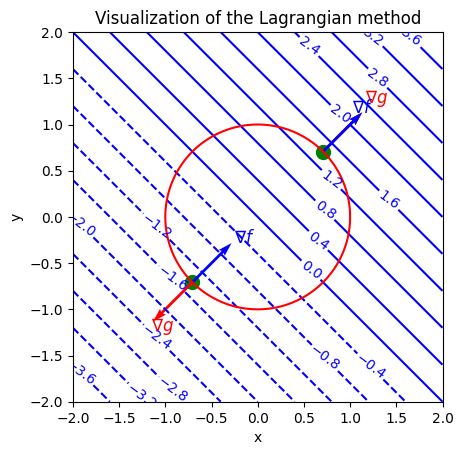

In [5]:
import numpy as np

# Create a grid of x and y values
x = np.linspace(-2, 2, 400)
y = np.linspace(-2, 2, 400)
X, Y = np.meshgrid(x, y)

# Calculate the values of the Lagrangian function for the grid
lambda_values = [-1/np.sqrt(2), 1/np.sqrt(2)]  # Values of lambda
Z = f(X, Y)

# Create contour plots for the Lagrangian function and constraint
contour_levels = 20  # Number of contour levels
contour_values = plt.contour(X, Y, Z, levels=contour_levels, colors='blue')

# Label the contour lines with their values
plt.clabel(contour_values, inline=1, fontsize=10)

# Plot the constraint contour line
constraint_values = plt.contour(X, Y, g(X, Y), levels=[0], colors='red')


# Highlight the optimal points
optimal_points = [(1/np.sqrt(2), 1/np.sqrt(2)), (-1/np.sqrt(2), -1/np.sqrt(2))]
optimal_values = [f(*point) for point in optimal_points]
plt.scatter(*zip(*optimal_points), c='green', marker='o', s=100)

# Add gradient vectors at optimal points. Add also text labels
proportionality_constant = 0.3
for point in optimal_points:
    grad_g = proportionality_constant * np.array([2*point[0], 2*point[1]])
    grad_Z = proportionality_constant * np.array([*grad_f(point[0], point[1])])
    scale_factor = np.linalg.norm(grad_g) / np.linalg.norm(grad_Z)
    plt.quiver(*point, *grad_g, color='red', angles='xy', scale_units='xy', scale=1)
    plt.quiver(*point, *grad_Z*scale_factor, color='blue', angles='xy', scale_units='xy', scale=1)
    plt.text((1.04)*point[0]+grad_g[0], (1.15)*point[1]+grad_g[1], r'$\nabla g$', color='red', fontsize=12)
    plt.text((0.9)*point[0]+(0.90)*grad_Z[0]*scale_factor, point[1]+grad_Z[1]*scale_factor, r'$\nabla f$', color='blue', fontsize=12)


# Set axis labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Visualization of the Lagrangian method')

plt.axis('square')
plt.show()

En esta imagen podemos observar como el punto que maximiza el valor de la funcion pero que sigue cumpliendo con la restriccion, es aquel igual a la tangente entre el circulo rojo (el cual representa la restriccion), y una linea igual que la azul (la cual representa valores donde el valor de la funcion es el mismo), pero que se situe en el punto del circulo correspondiente al maximo valor de la direccion de ∇f (el cual indica la direccion donde el valor de la funcion se va haciendo mas grande).

En este caso puede observarse como hay un maximo y un minimo en la funcion con restriccion.

 - **1d** Vuelve a resolver el problema de optimización, pero ahora hazlo minimizando la función lagrangiana $\mathcal{L}$ directamente con alguna herramienta numérica (no derives). Usa de nuevo el módulo ```scipy.optimize```. Comprueba que obtienes el mismo resultado que en el apartado anterior.

In [6]:
from scipy.optimize import minimize

# Implementa aquí tu solución

# EN VERDAD BUSCO EL MINIMO PERO BUENO LO HACEMOS PARA EL MAXIMO PARA QUE QUEDE BONIO

# Define the Lagrangian function L(x, y, lambda)
def lagrangian(x, y, lambda_):
    return f(x, y) + lambda_ * g(x, y)

def lagrangian_one_arg(var):
    x,y,lamb = var

    return - lagrangian(x,y,lamb)

res = minimize(lagrangian_one_arg,(0,0,0))

print(res.x)

[ 0.70710622  0.70710622 -0.70710638]


 - **1e** Una vez más, utilizando el módulo ```scipy.optimize```, resuelve este problema de optimización, pero ahora directamente optimiza $f(x,y)$ imponiendo la restricción del problema. Es decir, no sigas la formulación de Lagrange, busca una herramienta que permita optimizar con condiciones.

In [7]:
from scipy.optimize import minimize

# Implementa aquí tu solución

# EN VERDAD BUSCO EL MINIMO PERO BUENO LO HACEMOS PARA EL MAXIMO PARA QUE QUEDE BONIO


def f_v(vars):
    x, y = vars

    return x+y

def g_v(vars):
    x,y = vars

    return x**2 + y**2 -1.0

constraints = [{'type': 'eq', 'fun': g_v}]

res = minimize(f_v, (0,0), constraints = constraints)

print(res)

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 1.4142137537318966
       x: [ 7.071e-01  7.071e-01]
     nit: 6
     jac: [ 1.000e+00  1.000e+00]
    nfev: 26
    njev: 6


## Ejercicio 2: Lagrange — Casos básicos (II)

Se pretende optimizar el siguiente problema:
$$
\begin{aligned}
\mathrm{maximizar} \quad f(x,y)= (x + y)^2 & \\
\text{ sujeto a } \quad g(x, y) \equiv x^2 + y^2 &= 1
\end{aligned}
$$
usando el método de los multiplicadores de Lagrange. A continuación se definen en Python varias funciones relevantes para este caso de estudio:



In [8]:
# Define the objective function f(x, y)
def f(x, y):
    return (x + y)**2

def grad_f(x, y):
    return np.array([2*x, 2*y])

# Define the constraint function g(x, y)
def g(x, y):
    return x**2 + y**2 - 1

# Define the Lagrangian function L(x, y, lambda)
def lagrangian(x, y, lambda_):
    return f(x, y) + lambda_ * g(x, y)

 - **2a** El siguiente bloque de código muestra en un gráfico 3D la función a maximizar $f(x,y)$, la restricción $g(x,y)$ sobre el plano $OXY$ y su proyección sobre $f(x,y)$. Estima visualmente dónde aparecerán los máximos del problema.

In [9]:
# Create a grid of x and y values
x = np.linspace(-1.1, 1.1, 200)
y = np.linspace(-1.1, 1.1, 200)
X, Y = np.meshgrid(x, y)

# Calculate the function values
Z = f(X,Y)
# Create the 3D surface plot
fig = go.Figure()

# Add the 3D surface plot
fig.add_trace(go.Surface(z=Z, x=X, y=Y, name='f(x, y) = x + y', showscale=False))

# Create the 2D circle curve in the OXY plane
t = np.linspace(0, 2 * np.pi, 100)

trace_circle_OXY = go.Scatter3d(
    x=np.cos(t),
    y=np.sin(t),
    z=np.zeros_like(x),
    mode='lines',
    marker=dict(color='black', size=20),
    line=dict(width=20),
    showlegend=False
)

trace_circle_proj = go.Scatter3d(
    x=np.cos(t),
    y=np.sin(t),
    z=f(np.cos(t), np.sin(t)),
    mode='lines',
    marker=dict(color='green', size=20),
    line=dict(width=20),
    showlegend=False
)

max_lag_point = go.Scatter3d(
    x= [np.sqrt(2)/2],
    y= [np.sqrt(2)/2],
    z= [2],
    text='Max Lagrange',
    name= 'Max Lagrange',
    mode='markers',
    marker = dict(size=15, color='red'),
)
max_lag_point2 = go.Scatter3d(
    x= [-np.sqrt(2)/2],
    y= [-np.sqrt(2)/2],
    z= [2],
    text='Max Lagrange',
    name= 'Max Lagrange',
    mode='markers',
    marker = dict(size=15, color='red'),
)

# Add the 2D circle projection onto the OXY plane
fig.add_trace(trace_circle_OXY)
fig.add_trace(trace_circle_proj)
fig.add_trace(max_lag_point)
fig.add_trace(max_lag_point2)

fig.show()


 - **2b** Resuelve el sistema de ecuaciones resultante de plantear el problema de Lagrange. Utiliza el módulo ```scipy.optimize``` para su resolución.

In [10]:
from scipy.optimize import fsolve

# Implementa aquí tu solución

# Resolvemos el sistema de ecuaciones y la derivada = 0 queda como 2(x+y) + 2λx = 0 |  2(x+y) + 2λy = 0  | x**2 + y**2 -1 = 0

def equations(vars):
    x,y,lamb = vars

    eq1 = 2*(x+y) + 2*lamb * x
    eq2 = 2*(x+y) + 2*lamb * y
    eq3 = x**2 + y**2 -1

    return [eq1,eq2,eq3]

# NOTA dependiendo de la inicializacion ej(1,1,1) la funcion encuentra diferentes soluciones = 0
x_opt, y_opt, lamb_opt = fsolve(equations,(-1,-1,1))

print(f"La solucion es {x_opt=}, {y_opt=}, {lamb_opt=}")  

La solucion es x_opt=-0.7071067811865482, y_opt=-0.7071067811865468, lamb_opt=-1.9999999999999996


 - **2c** El siguiente bloque de código muestra las cuervas de nivel de la función a optimizar, junto con la curva restricción. En base a esta imagen, analiza geométricamente el problema de optimización de Lagrange.

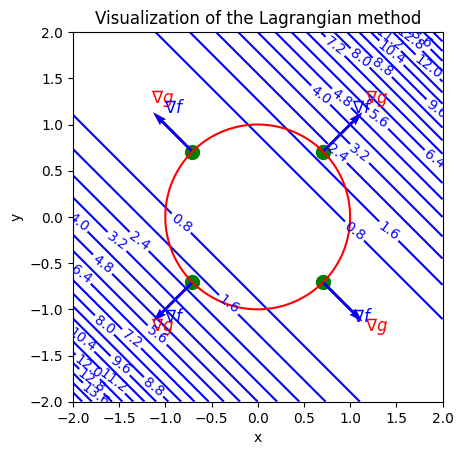

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Create a grid of x and y values
x = np.linspace(-2, 2, 400)
y = np.linspace(-2, 2, 400)
X, Y = np.meshgrid(x, y)

# Calculate the values of the Lagrangian function for the grid
lambda_values = [0, -2]  # Values of lambda
Z = f(X, Y)

# Create contour plots for the Lagrangian function and constraint
contour_levels = 20  # Number of contour levels
contour_values = plt.contour(X, Y, Z, levels=contour_levels, colors='blue')

# Label the contour lines with their values
plt.clabel(contour_values, inline=1, fontsize=10)

# Plot the constraint contour line
constraint_values = plt.contour(X, Y, g(X, Y), levels=[0], colors='red')

# Highlight the optimal points
optimal_points = [(1/np.sqrt(2), 1/np.sqrt(2)), (-1/np.sqrt(2), -1/np.sqrt(2)),
                  (-1/np.sqrt(2), 1/np.sqrt(2)), (1/np.sqrt(2), -1/np.sqrt(2))]
optimal_values = [f(*point) for point in optimal_points]
plt.scatter(*zip(*optimal_points), c='green', marker='o', s=100)

# Add gradient vectors at optimal points. Add also text labels
proportionality_constant = 0.3
for point in optimal_points:
    grad_g = proportionality_constant * np.array([2*point[0], 2*point[1]])
    grad_Z = proportionality_constant * np.array([*grad_f(point[0], point[1])])
    scale_factor = np.linalg.norm(grad_g) / np.linalg.norm(grad_Z)
    plt.quiver(*point, *grad_g, color='red', angles='xy', scale_units='xy', scale=1)
    plt.quiver(*point, *grad_Z*scale_factor, color='blue', angles='xy', scale_units='xy', scale=1)
    plt.text((1.04)*point[0]+grad_g[0], (1.15)*point[1]+grad_g[1], r'$\nabla g$', color='red', fontsize=12)
    plt.text((0.9)*point[0]+(0.90)*grad_Z[0]*scale_factor, point[1]+grad_Z[1]*scale_factor, r'$\nabla f$', color='blue', fontsize=12)


# Set axis labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Visualization of the Lagrangian method')

plt.axis('square')
plt.show()

En esta imagen podemos observar como existen diferentes puntos que maximizan el valor de la funcion pero que sigue cumpliendo con la restriccion, son aquellos iguales a la tangente entre el circulo rojo (el cual representa la restriccion), y una linea igual que la azul (la cual representa valores donde el valor de la funcion es el mismo), pero que se situe en aquellas posiciones del circulo iguales a la maxima direccion de ∇f (el cual indica la direccion donde el valor de la funcion se va haciendo mas grande).

En este caso puede observarse que existen 2 maximos situados en los puntos verdes de arriba a la derecha y abajo a la izquierda, mientras que existen 2 minimos situados en los puntos verdes de arriba a la izquierda y abajo a la derecha. 

 - **2d** Utilizando el módulo ```scipy.optimize```, resuelve este problema de optimización, pero ahora directamente optimiza $f(x,y)$ imponiendo la restricción del problema. Es decir, no sigas la formulación de Lagrange, busca una herramienta que permita optimizar con condiciones.

In [12]:
from scipy.optimize import minimize

# Implementa aquí tu solución

def f_v(var):
    x,y = var
    return f(x,y)

def g_v(var):
    x,y = var
    return g(x,y)

constraints = [{'type' : 'eq', 'fun': g_v}]

res = minimize(f_v,(1,1),constraints = constraints)

print(res)

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 2.000000000004556
       x: [ 7.071e-01  7.071e-01]
     nit: 5
     jac: [ 2.828e+00  2.828e+00]
    nfev: 15
    njev: 5


## Ejercicio 3: Lagrange — Casos básicos (III)

Se pretende optimizar el siguiente problema:
$$
\begin{aligned}
\mathrm{maximizar} \quad f(x,y)= x^2y & \\
\text{ sujeto a } \quad g(x, y) \equiv x^2 + y^2 &= 3
\end{aligned}
$$
usando el método de los multiplicadores de Lagrange. A continuación se definen en Python varias funciones relevantes para este caso de estudio:



In [24]:
# Define the objective function f(x, y)
def f(x, y):
    return x**2 * y

def grad_f(x, y):
    return np.array([2*x*y, x**2])

# Define the constraint function g(x, y)
def g(x, y):
    return x**2 + y**2 - 3

# Define the Lagrangian function L(x, y, lambda)
def lagrangian(x, y, lambda_):
    return f(x, y) + lambda_ * g(x, y)

 - **3a** El siguiente bloque de código muestra en un gráfico 3D la función a maximizar $f(x,y)$, la restricción $g(x,y)$ sobre el plano $OXY$ y su proyección sobre $f(x,y)$. Estima visualmente dónde aparecerán los máximos del problema.

In [30]:
# Create a grid of x and y values
x = np.linspace(-1.1, 1.1, 200)
y = np.linspace(-1.1, 1.1, 200)
X, Y = np.meshgrid(x, y)

# Calculate the function values
Z = f(X,Y)
# Create the 3D surface plot
fig = go.Figure()

# Add the 3D surface plot
fig.add_trace(go.Surface(z=Z, x=X, y=Y, name='f(x, y) = x + y', showscale=False))

# Create the 2D circle curve in the OXY plane
t = np.linspace(0, 2 * np.pi, 100)

trace_circle_OXY = go.Scatter3d(
    x=np.cos(t),
    y=np.sin(t),
    z=np.zeros_like(x),
    mode='lines',
    marker=dict(color='black', size=20),
    line=dict(width=20),
    showlegend=False
)

trace_circle_proj = go.Scatter3d(
    x=np.cos(t),
    y=np.sin(t),
    z=f(np.cos(t), np.sin(t)),
    mode='lines',
    marker=dict(color='green', size=20),
    line=dict(width=20),
    showlegend=False
)


# Add the 2D circle projection onto the OXY plane
fig.add_trace(trace_circle_OXY)
fig.add_trace(trace_circle_proj)
fig.show()


 - **3b** Resuelve el sistema de ecuaciones resultante de plantear el problema de Lagrange. Utiliza el módulo ```scipy.optimize``` para su resolución.

In [15]:
from scipy.optimize import fsolve

# Implementa aquí tu solución
# NOTA La solucion cuadra con la de mas adelante, pero no con la figura
# Resolvemos el sistema de ecuaciones y la derivada = 0 
# queda como f(x,y)= x^2y  g(x,y) = x^2 + y^2 -3, f(x) + λg(x) -> x^2y + λx^2 + λy^2 -3λ
# derivamos y queda der(x) = y*2x + 2xλ   der(y) = x^2 + 2yλ    der(λ) = x^2 + y^2 -3

def equations(vars):
    x,y,lamb = vars

    eq1 = 2*x*y + 2*x*lamb
    eq2 = x**2 + 2*y*lamb
    eq3 = x**2 + y**2 -3

    return [eq1,eq2,eq3]

# NOTA dependiendo de la inicializacion ej(1,1,1) la funcion encuentra diferentes soluciones = 0
x_opt, y_opt, lamb_opt = fsolve(equations,(1,1,1))

print(f"La solucion es {x_opt=}, {y_opt=}, {lamb_opt=}")  

La solucion es x_opt=-2.269017636550516e-11, y_opt=1.7320508075683982, lamb_opt=-3.191863311289548e-11


 - **3c** El siguiente bloque de código muestra las cuervas de nivel de la función a optimizar, junto con la curva restricción. En base a esta imagen, analiza geométricamente el problema de optimización de Lagrange.

C:\Users\lluis\AppData\Local\Temp\ipykernel_15176\1323682684.py:36: RuntimeWarning:

divide by zero encountered in scalar divide

C:\Users\lluis\AppData\Local\Temp\ipykernel_15176\1323682684.py:38: RuntimeWarning:

invalid value encountered in multiply

C:\Users\lluis\AppData\Local\Temp\ipykernel_15176\1323682684.py:40: RuntimeWarning:

invalid value encountered in scalar multiply

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


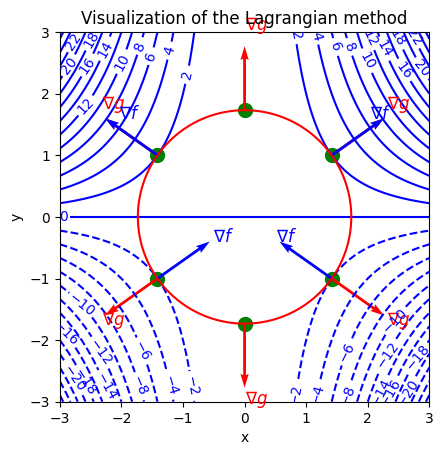

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# Create a grid of x and y values
x = np.linspace(-3, 3, 400)
y = np.linspace(-3, 3, 400)
X, Y = np.meshgrid(x, y)

# Calculate the values of the Lagrangian function for the grid
lambda_values = [-1, 1, 0]  # Values of lambda
Z = f(X, Y)

# Create contour plots for the Lagrangian function and constraint
contour_levels = 26  # Number of contour levels
contour_values = plt.contour(X, Y, Z, levels=contour_levels, colors='blue')

# Label the contour lines with their values
plt.clabel(contour_values, inline=1, fontsize=10)

# Plot the constraint contour line
constraint_values = plt.contour(X, Y, g(X, Y), levels=[0], colors='red')

# Highlight the optimal points
optimal_points = [(np.sqrt(2), 1),  (-np.sqrt(2), 1),
                  (np.sqrt(2),-1), (-np.sqrt(2),-1),
                  (0, np.sqrt(3)), (0,-np.sqrt(3))]

optimal_values = [f(*point) for point in optimal_points]
plt.scatter(*zip(*optimal_points), c='green', marker='o', s=100)

# Add gradient vectors at optimal points. Add also text labels
proportionality_constant = 0.3
for point in optimal_points:
    grad_g = proportionality_constant * np.array([2*point[0], 2*point[1]])
    grad_Z = proportionality_constant * np.array([*grad_f(point[0], point[1])])
    scale_factor = np.linalg.norm(grad_g) / np.linalg.norm(grad_Z)
    plt.quiver(*point, *grad_g, color='red', angles='xy', scale_units='xy', scale=1)
    plt.quiver(*point, *grad_Z*scale_factor, color='blue', angles='xy', scale_units='xy', scale=1)
    plt.text((1.04)*point[0]+grad_g[0], (1.15)*point[1]+grad_g[1], r'$\nabla g$', color='red', fontsize=12)
    plt.text((0.9)*point[0]+(0.90)*grad_Z[0]*scale_factor, point[1]+grad_Z[1]*scale_factor, r'$\nabla f$', color='blue', fontsize=12)


# Set axis labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Visualization of the Lagrangian method')

plt.axis('square')
plt.show()

En esta imagen podemos observar como existen diferentes puntos que maximizan el valor de la funcion pero que sigue cumpliendo con la restriccion, son aquellos iguales a la tangente entre el circulo rojo (el cual representa la restriccion), y una linea igual que la azul (la cual representa valores donde el valor de la funcion es el mismo), pero que se situe en aquellas posiciones del circulo iguales a la maxima direccion de ∇f (el cual indica la direccion donde el valor de la funcion se va haciendo mas grande).

En este caso puede observarse que existen 2 maximos situados en los puntos verdes de arriba a la derecha y arriba a la izquierda, mientras que existen otros maximos y minimos locales en el resto de puntos verdes.

 - **3d** Utilizando el módulo ```scipy.optimize```, resuelve este problema de optimización, pero ahora directamente optimiza $f(x,y)$ imponiendo la restricción del problema. Es decir, no sigas la formulación de Lagrange, busca una herramienta que permita optimizar con condiciones.

In [21]:
from scipy.optimize import minimize

# Implementa aquí tu solución
# NOTA la solucion no cuadra con el dibujo 3d


def f_v(var):
    x,y = var
    return f(x,y)

def g_v(var):
    x,y = var
    return g(x,y)

constraints = [{'type' : 'eq', 'fun': g_v}]

res = minimize(f_v,(1,1),constraints = constraints)

print(res)


 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 1.6298764586201998e-14
       x: [ 9.701e-08  1.732e+00]
     nit: 6
     jac: [ 1.082e-03  9.750e-08]
    nfev: 20
    njev: 6


## Ejercicio 4: [KKT] Restricciones con inecuaciones — caso 1

Resuelve el siguiente problema de optimización utiliza el módulo ```scipy.optimize``` (en particular, la función ```minimize```).
<center>
<div>
<img src="https://drive.upm.es/index.php/apps/files_sharing/ajax/publicpreview.php?x=1680&y=557&a=true&file=opt_restricciones_164.png&t=YzvqwRjVh1U0aXy&scalingup=0" width="450"/>
</div>
</center>


$$
\begin{aligned}
\mathrm{minimizar} \quad q(x)=\left(x_1-1\right)^2+\left(x_2-2.5\right)^2 & \\
\text { sujeto a} \quad x_1-2 x_2+2 & \geq 0, \\
-x_1-2 x_2+6 & \geq 0, \\
-x_1+2 x_2+2 & \geq 0, \\
x_1 & \geq 0, \\
x_2 & \geq 0 .
\end{aligned}
$$

In [22]:
from scipy.optimize import minimize

# Implementa aquí tu solución

def objective(x):
    x1,x2 = x

    return (x1 -1)**2 + (x2 - 2.5)**2

# NOTA ineq es solo para inqcuaciones >= 0
constraints = [{'type': 'ineq', 'fun': lambda x: x[0]-2 * x[1] + 2}, # x1 - 2*2 + 2 >0 0
               {'type': 'ineq', 'fun': lambda x: -x[0]-2 * x[1] + 6},
               {'type': 'ineq', 'fun': lambda x: -x[0]+2 * x[1] + 2},
               {'type': 'ineq', 'fun': lambda x: x[0]},
               {'type': 'ineq', 'fun': lambda x: x[1]}]

res = minimize(objective,(0,0),constraints = constraints)

print(res)

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 0.799999999999998
       x: [ 1.400e+00  1.700e+00]
     nit: 4
     jac: [ 8.000e-01 -1.600e+00]
    nfev: 12
    njev: 4


## Ejercicio 5: [KKT] Restricciones con inecuaciones — caso 2

Resuelve el siguiente problema de optimización utiliza el módulo ```scipy.optimize``` (en particular, la función ```minimize```).
$$
\begin{aligned}
\mathrm{minimizar} \quad q(x) = 2x_1 + 3x_2 + 4x_1^2 + 2x_1x_2 + x_2^2 & \\
\text { sujeto a} \quad x_1 - x_2 \geq 0, \\
x_1 + x_2 \leq 4, \\
x_1 \leq 3, \\
\end{aligned}
$$

In [23]:
from scipy.optimize import minimize

# NOTA para el <= ponerle un menos a toda la ecuacion osea -f(x)
# Implementa aquí tu solución

def objective(x):
    x1,x2 = x

    return 2*x1 + 3*x2 + 4*x1**2 + 2*x1*x2 + x2**2

# NOTA ineq es solo para inqcuaciones >= 0
constraints = [{'type': 'ineq', 'fun': lambda x: x[0] - x[1]}, 
               {'type': 'ineq', 'fun': lambda x: -(x[0] +  x[1] -4)},
               {'type': 'ineq', 'fun': lambda x: -(x[0] -3)}]

res = minimize(objective,(0,0),constraints = constraints)

print(res)


 message: Optimization terminated successfully
 success: True
  status: 0
     fun: -2.3333333333333335
       x: [ 1.667e-01 -1.667e+00]
     nit: 3
     jac: [ 5.960e-08  2.980e-08]
    nfev: 11
    njev: 3


## Ejercicio 6: Estudio analítico de un algoritmo de optimización numérica

Como has visto en los ejercicios anteriores, la función ```minimize``` del módulo ```scipy.optimize``` es ampliamente usada para problemas de optimización no entera. Esta función implementa multitud de algoritmos que permiten resolver problemas de diversa índole: con información sobre el jacobiano/hessiano o sin ella, problemas acotados, con restricciones de igualdad o de desigualdad, etc.

Explica un algoritmo de los implementados en la función ```minimize``` ([ver documentación](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html#id9), argumento ```method```), según la siguiente asignación:

 - **Algoritmo BFGS**: grupos 1, 4, 7
 - **Nelder Mead**: grupos 2, 5, 8
 - **Newton-CG**: grupos 3, 6, 9

*Escribe una breve explicación (aprox. 1 cara de A4) para la entrega, y estate preparado para explicar el método en la defensa*.

### Nelder-Mead
***Nelder-Mead*** es un método de optimización sin derivadas utilizado para minimizar una función en un espacio multidimensional. Es especialmente útil cuando no se dispone de información sobre el gradiente o el matriz hessianda de la función (matriz para obtener minimos y máximos al igualar las derivadas a cero). 

Es un método heurístico que trabaja a partir de un simplejo, siendo un simplejo una estructura geométrica formada por n+1 puntos en un espacio de n dimensiones, y usa operaciones geométricas para ajustar el simplejo y moverse hacia el mínimo.

*Explicación del algoritmo*
1. **Inicialización**: Se empieza con un conjunto de 𝑛+1 puntos en el espacio de dimensión 𝑛. Estos puntos forman un simplejo.
2. **Evaluación**: Se evalúa la función objetivo en cada uno de los puntos del simplejo.
3. **Ordenación**: Se ordenan los puntos del simplejo según sus valores de función objetivo.
4. **Operaciones del simplejo**: Se aplican las siguientes operaciones para ajustar el simplejo y explorar el espacio:
    - **Reflexión**: Se calcula un nuevo punto de reflexión y se evalúa. Si mejora el valor objetivo, reemplaza el peor punto del simplejo.
    - **Expansión**: Si el punto reflejado es mejor que todos los puntos, se expande en la misma dirección para explorar más.
    - **Contracción**: Si la reflexión no mejora, se contrae el simplejo hacia el mejor punto conocido.
    - **Reducción**: Si la contracción falla, se reduce el simplejo alrededor del mejor punto para enfocarse en una región más pequeña.
5. **Iteración**: Se repiten los pasos de evaluación y ajuste hasta que se cumpla un criterio de convergencia.

[Video explicativo](https://www.youtube.com/watch?v=j2gcuRVbwR0&ab_channel=MilesChen)

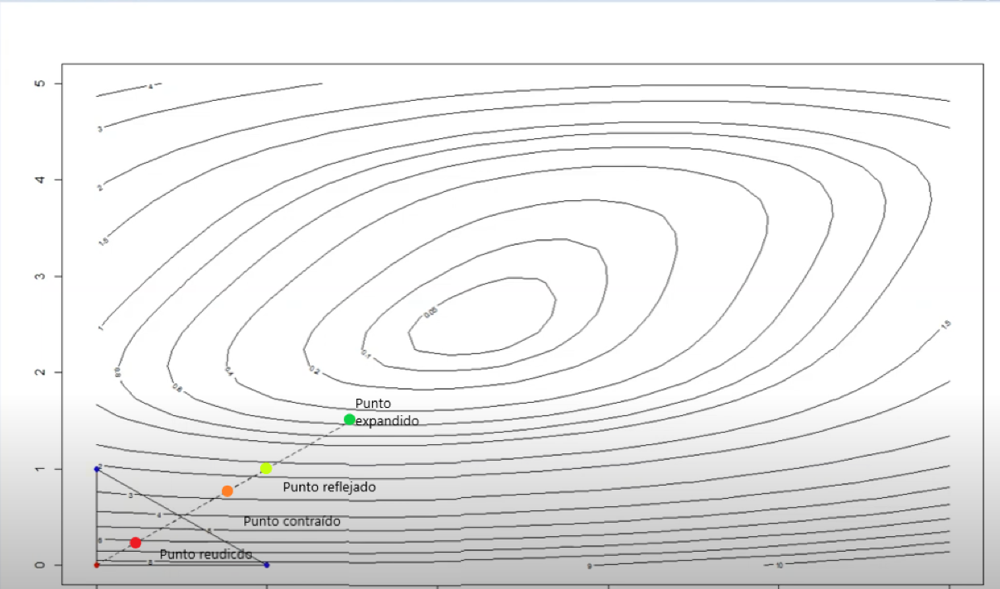

### Pseudocódigo
```
1. Inicializar simplejo con puntos iniciales en el espacio de búsqueda.
2. Evaluar la función objetivo en cada punto del simplejo.
3. Mientras no se cumpla el criterio de parada:
    a. Ordenar los puntos del simplejo según sus valores de la función objetivo.
    b. Calcular el punto reflejado:
       - Si el punto reflejado es mejor que el peor, pero no mejor que el mejor:
           - Reemplazar el peor punto con el reflejado.
       - Si el punto reflejado es el mejor:
           - Calcular punto expandido.
           - Si el punto expandido es mejor, reemplazar el peor con el expandido.
           - Si no, reemplazar el peor con el reflejado.
       - Si el reflejado es peor que todos:
           - Calcular el punto de contracción.
           - Si el punto de contracción es mejor, reemplazar el peor.
           - Si no, reducir el simplejo alrededor del mejor punto.
4. Devolver el mejor punto como solución.

```

### Pros y Contras
**Pros:**

- Sin derivadas: No requiere información sobre derivadas, lo que es ideal para funciones no diferenciables o desconocidas.
- Simplicidad: Es fácil de implementar y comprender.
- Robustez: Puede manejar problemas de optimización en dimensiones bajas y funciones con irregularidades.

**Contras:**

- No garantiza convergencia: En problemas de alta dimensión o complejos, puede no converger al óptimo global.
- Lentitud: En dimensiones mayores (más de 10), el rendimiento disminuye significativamente.
- Sensibilidad a la inicialización: La calidad de la solución puede depender de los puntos iniciales.

### Usos
El método ***Nelder-Mead*** es útil en problemas donde:

- La función objetivo es difícil de derivar.
- No se dispone de gradiente o hessiano.
- El problema tiene menos de 10 dimensiones y no se requiere una solución óptima en tiempo real.
- Se usa comúnmente en aplicaciones de ajuste de parámetros en modelos estadísticos, optimización de funciones experimentales, y en problemas de optimización en los que evaluar la función es costoso o ruidoso (por ejemplo, optimización en simulaciones).


## Ejercicio 7: Casos de aplicación (I)

El departamento financiero de una empresa de venta y reparación de ordenadores desea maximizar su beneficio mensual ($B$) que depende de las unidades vendidas ($v$), las unidades reparadas ($r$), el número de trabajadores ($t$), y el número de clientes ($c$). El beneficio se puede modelar como sigue:

$$
B(v, r, t, c) = 20000 - 4(v - 100)^2 - 3(r - 50)^2 - t^2 + 5c^2
$$

Se sabe que la expresión anterior funciona correctamente solo cuando las unidades vendidas ($v$) están en el rango de $5$ a $100$, el número de trabajadores ($t$) es menor que $100$ y el número de ordenadores vendidos ($v$) más reparados ($r$) es menor que $102$. Además, por imposición del departamento laboral, la empresa debe contar con como mínimo dos trabajadores ($t$) por cada cliente ($c$).
 - **7a** Calcula $(v, r, t, c)$ que maximizan los beneficios de la empresa por *fuerza bruta*.


In [31]:
# Implementa aquí tu solución

from itertools import product

# Por cierto no se puede miminize ya que algunos valores son enteros

def objective(v: int, r: int,t: int, c:int) -> float:
    return 20000 -4 * (v-100)**2 - 3 * (r-50)**2 -t**2 + 5 * c**2

vs = range(5,101)
ts = range(101)
cs = range(101) # Como no hay restriccion de valores unicos, probamos con vals altos
rs = range(101) # Como no hay restriccion de valores unicos, probamos con vals altos

solution = None
current_b_max = 0
for v,r,t,c in product(vs,rs,ts,cs):
    if v + r <= 102 and 2 * c <= t:
        b_candidate = objective(v,r,t,c)
        if b_candidate > current_b_max:
            current_b_max = b_candidate
            solution = (v,r,t,c)


print(f"La solucion optima es {solution}")


La solucion optima es (79, 23, 100, 50)


 - **7b** Calcula $(v, r, t, c)$ que maximizan los beneficios de la empresa utilizando la librería ```gurobipy``` de Python.

In [33]:
%pip install -q gurobipy

Note: you may need to restart the kernel to use updated packages.


In [34]:
import gurobipy as gp
from gurobipy import GRB

# Implementa aquí tu solución

model = gp.Model("Profit_Maximization")

v = model.addVar(lb=5, ub=100,vtype=GRB.INTEGER,name='v')
r = model.addVar(lb=0, ub=100,vtype=GRB.INTEGER,name='r')
t = model.addVar(lb=0, ub=100,vtype=GRB.INTEGER,name='t')
c = model.addVar(lb=0,vtype=GRB.INTEGER,name='c')

model.setObjective(20000 -4 * (v-100)**2 - 3 * (r-50)**2 -t**2 + 5 * c**2,GRB.MAXIMIZE)

model.addConstr(v + r <= 102)
model.addConstr(2*c <= t)

model.optimize()

print(f"{v.X=} {r.X=} {t.X=} {c.X=} ")

Restricted license - for non-production use only - expires 2025-11-24
Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (win64 - Windows 10.0 (19045.2))

CPU model: AMD Ryzen 7 6800H with Radeon Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 2 rows, 4 columns and 4 nonzeros
Model fingerprint: 0x992ec370
Model has 4 quadratic objective terms
Variable types: 0 continuous, 4 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+00]
  Objective range  [3e+02, 8e+02]
  QObjective range [2e+00, 1e+01]
  Bounds range     [5e+00, 1e+02]
  RHS range        [1e+02, 1e+02]
Found heuristic solution: objective -23600.00000
Presolve removed 1 rows and 2 columns
Presolve time: 0.00s
Presolved: 5 rows, 152 columns, 304 nonzeros
Found heuristic solution: objective 16049.000000
Variable types: 0 continuous, 152 integer (150 binary)

Root relaxation: objective 1.995500e+04, 7 iterations, 0.00

## Ejercicio 8: Casos de aplicación (II)

Considera una cierta empresa que produce dos artículos: tazas y platos. Esto es lo que sabemos:

 - Una vez fabricada, una taza se vende a 27 € y un plato a 21 €.
 - Cada taza cuesta 10 € en materiales y 14 € en mano de obra (fijos).
 - Cada plato cuesta 9 € en materiales y 10 € en mano de obra (fijos).
 - Para fabricar cada taza se necesitan 2.2 horas de trabajo.
 - Para fabricar cada plato se necesita 1 hora de trabajo.
 - La empresa dispone de una cantidad ilimitada de materias primas.
 - Debido al número limitado de trabajadores, la empresa dispone de un máximo de 100 horas de mano de obra.
 - La demanda de tazas es ilimitada, pero la de platos es de 30 unidades.

El objetivo de la empresa es maximizar los beneficios. Resuelve este problema de optimización usando el paquete ```gurobipy```.

In [35]:
import gurobipy as gp
from gurobipy import GRB

# Implementa aquí tu solución

model = gp.Model("Profit_Maximization")

t = model.addVar(lb = 0,vtype=GRB.INTEGER,name='t')
p = model.addVar(lb = 0,ub=30,vtype=GRB.INTEGER,name='p')

# valor de la taza es 27 - 10 -14 = 3
# valor del plato es 21 -9 -10 = 2
model.setObjective(3*t + 2*p,GRB.MAXIMIZE)

# constrain temporal
model.addConstr(2.2*t + 1*p <= 100)

model.optimize()

print(f"tazas fabricadas = {t.X}, platos fabricados =  {p.X}")


Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (win64 - Windows 10.0 (19045.2))

CPU model: AMD Ryzen 7 6800H with Radeon Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 1 rows, 2 columns and 2 nonzeros
Model fingerprint: 0x4eee8978
Variable types: 0 continuous, 2 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+00]
  Objective range  [2e+00, 3e+00]
  Bounds range     [3e+01, 3e+01]
  RHS range        [1e+02, 1e+02]
Found heuristic solution: objective 137.0000000
Found heuristic solution: objective 153.0000000
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros
Variable types: 0 continuous, 2 integer (0 binary)
Found heuristic solution: objective 154.0000000

Root relaxation: cutoff, 0 iterations, 0.00 seconds (0.00 work units)

Explored 1 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 16 (of 16 available processors)

Soluti

## Ejercicio 9: Regresión lineal por descenso de gradiente

Sea una función que aplica la transformación $wx + b$ a un único input $x$, siendo $w$ y $b$ parámetros a determinar. De dicha transformación se obtiene un valor que llamaremos $y_{\mathrm{pred}}$. Se disponen de unos datos de entrenamiento $y_{\mathrm{true}}$. Para un determinado batch de observaciones, el objetivo es determinar los valores óptimos de $w$ y $b$ que minimizan el error cuadrático medio $MSE$ aplicando la técnica de descenso de gradiente.

<center>
<div>
<img src="https://drive.upm.es/s/EkosnRQDSXNGj3L/download" width="250"/>
</div>
</center>

- **9a** Completa la siguiente estructura de código que permite simular el problema anterior.

<!-- - **9a** Completa la siguiente estructura de código que permite simular una red neuronal **con una única capa, una única neurona y un único input**. La función de activación que se usará es la LINEAL, lo que es análogo a no usar función de activación alguna, por lo que la omitiremos por simplicidad.
-->

In [36]:
# Completa los espacios marcados con #######

import numpy as np

class Single_Neuron_Layer:

    def __init__(self, n_inputs: int) -> None:
        self.weights = 0.01 * np.random.randn(n_inputs,1)
        self.bias = 0.0

    def forward(self, inputs) -> None:
        self.inputs = inputs
        self.output = np.dot(inputs,self.weights) + self.bias

    def backward(self, dvalues) -> None:
        self.dweights = np.dot(self.inputs.T, dvalues)
        self.dbias = np.sum(dvalues, axis=0, keepdims=True)
        self.dinputs = np.dot(dvalues, self.weights.T)


class Optimizer_SGD:

    def __init__(self, learning_rate=1.0) -> None:
        self.learning_rate = learning_rate

    def update_params(self, layer) -> None:

        weight_updates = -self.learning_rate * layer.dweights
        bias_updates = -self.learning_rate * layer.dbias

        layer.weights += weight_updates
        layer.bias += bias_updates


class Loss_MeanSquaredError():

    #Forward pass
    def forward(self, y_pred, y_true):
        sample_losses = np.mean((y_true - y_pred)**2)
        return sample_losses

    #Backward pass
    def backward(self, y_pred, y_true) -> None:
        # Implementa aquí tu solución
        samples = len(y_true)
        self.dinputs = -2.0 * (y_true - y_pred)/samples

 - **9b** Realiza un entrenamiento sobre los siguientes datos, y observa el resultado obtenido. En particular, asegúrate que $w$ y $b$ coinciden con los que obtendrías resolviendo el problema de regresión de forma tradicional (derivando el MSE respecto a cada parámetro, igualando a cero y resolviendo el sistema resultante).
$$
\begin{array}{|c|c|}
\hline x_i & y_i \\
\hline 1 & 6 \\
\hline 2 & 5 \\
\hline 3 & 7 \\
\hline 4 & 10 \\
\hline
\end{array}
$$


epoch = 0 loss= 52.328311443963685
epoch = 1000 loss= 1.0530538380280312
epoch = 2000 loss= 1.0500075940704057
epoch = 3000 loss= 1.0500000188844025
epoch = 4000 loss= 1.0500000000469607
epoch = 5000 loss= 1.0500000000001164
epoch = 6000 loss= 1.0500000000000003
epoch = 7000 loss= 1.0500000000000005
epoch = 8000 loss= 1.0500000000000003
epoch = 9000 loss= 1.0500000000000005
epoch = 10000 loss= 1.05
epoch = 11000 loss= 1.0499999999999998
epoch = 12000 loss= 1.0499999999999998
epoch = 13000 loss= 1.0499999999999998
epoch = 14000 loss= 1.0499999999999998
epoch = 15000 loss= 1.0499999999999998
epoch = 16000 loss= 1.0499999999999998
epoch = 17000 loss= 1.0499999999999998
epoch = 18000 loss= 1.0499999999999998
epoch = 19000 loss= 1.0499999999999998
La recta de regresion es: 3.4999999999999236 + 1.4000000000000261 *x


C:\Users\lluis\AppData\Local\Temp\ipykernel_15176\1475460319.py:35: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



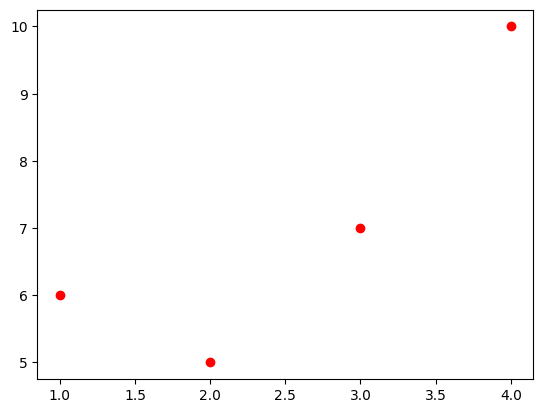

In [37]:
import matplotlib.pyplot as plt

X = np.array([1, 2, 3, 4]).reshape(-1, 1)
y = np.array([6, 5, 7, 10]).reshape(-1, 1)  # Target values

# Se visualizan los datos
plt.plot(X, y, 'ro')

# Implementa aquí tu solución

#Definicion de la arquitectura de la red
dense1 = Single_Neuron_Layer(X.shape[1])

# Funcion de activacion Lineal
loss_layer = Loss_MeanSquaredError()
optimizer = Optimizer_SGD(learning_rate= 0.01)

# Bucle de entrenamiento

for epoch in range(20000):
    # Fordward
    dense1.forward(X)
    loss = loss_layer.forward(dense1.output,y)

    if not epoch%1000:
        print(f"epoch = {epoch} loss= {loss}")
        
    # Backward
    loss_layer.backward(dense1.output,y)
    dense1.backward(loss_layer.dinputs)

    # Update parameters -> Optimizer
    optimizer.update_params(dense1) # Debe tener ya los gradientes

b = float(dense1.bias)
w = float(dense1.weights.flatten()[0])

print(f"La recta de regresion es: {b} + {w} *x")

## Ejercicio 10: Regresión multilineal

Ahora utilizaremos la base de datos ```diabetes``` del paquete ```scikit-learn```, que contiene datos de pacientes con diabetes (10 variables por observación), y una medida de la evolución de la enfermedad en un periodo de un año (variable a predecir $y$). Por tanto, ahora estamos en un caso de regresión multilineal: queremos ajustar una función del tipo

$$
\hat{y} = b + w_0 x_0 + w_1 x_1 + \ldots + w_{9} x_{9}
$$

Donde $b, w_0, w_1 \ldots, w_{9}$ son los coeficientes de regresión que deseamos estimar, $x_1, x_2, \ldots, x_{9}$ son las variables independientes.

In [38]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets

diabetes = datasets.load_diabetes()
X = diabetes['data']
y = diabetes['target'].reshape(-1, 1)

Define una arquitectura apropiada análoga a la del ejercicio anterior. Realiza el entrenamiento y grafica alguna variable junto a la proyección del hiperplano para comprobar resultados

In [39]:
!pip install seaborn

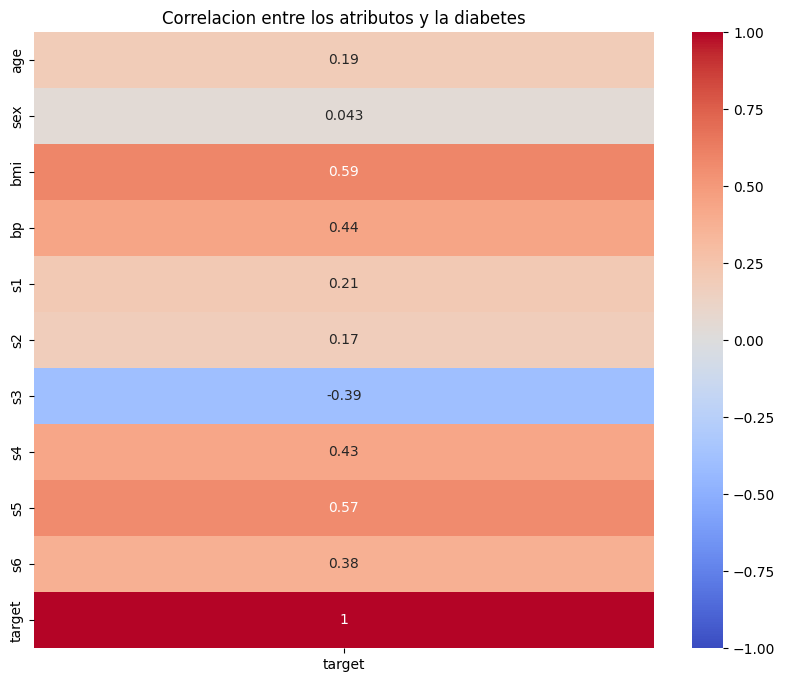

epoch = 0 loss= 29074.503665835287
epoch = 1000 loss= 5260.465151254548
epoch = 2000 loss= 4772.072036930532
epoch = 3000 loss= 4411.642652580866
epoch = 4000 loss= 4142.083268950787
epoch = 5000 loss= 3937.431541914193
epoch = 6000 loss= 3779.4780612212717
epoch = 7000 loss= 3655.417137074495
epoch = 8000 loss= 3556.212867315079
epoch = 9000 loss= 3475.4623404623776
epoch = 10000 loss= 3408.604397730596
epoch = 11000 loss= 3352.368627248955
epoch = 12000 loss= 3304.3913978942733
epoch = 13000 loss= 3262.948067137822
epoch = 14000 loss= 3226.7660105978466
epoch = 15000 loss= 3194.89390030366
epoch = 16000 loss= 3166.6101489163498
epoch = 17000 loss= 3141.3586421687432
epoch = 18000 loss= 3118.703499022199
epoch = 19000 loss= 3098.297113046907
El bias es: 152.1334841628953
y para cada peso:
Peso de age es 38.151518799957344
Peso de sex es -94.21503285722979
Peso de bmi es 367.8725911729122
Peso de bp es 243.78948684902784
Peso de s1 es 7.067456580546851
Peso de s2 es -36.6372728273641
P

C:\Users\lluis\AppData\Local\Temp\ipykernel_15176\2049545235.py:41: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



In [40]:
# Implementa aquí tu solución

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Se visualizan los datos
diab_df = pd.DataFrame(X, columns=diabetes.feature_names)
diab_df['target'] = y
corr_matrix = diab_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix[['target']], annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlacion entre los atributos y la diabetes")
plt.show()

#Definicion de la arquitectura de la red
dense1 = Single_Neuron_Layer(X.shape[1])

# Funcion de activacion Lineal
loss_layer = Loss_MeanSquaredError()
optimizer = Optimizer_SGD(learning_rate= 0.01)

# Bucle de entrenamiento

for epoch in range(20000):
    # Fordward
    dense1.forward(X)
    loss = loss_layer.forward(dense1.output,y)

    if not epoch%1000:
        print(f"epoch = {epoch} loss= {loss}")
        
    # Backward
    loss_layer.backward(dense1.output,y)
    dense1.backward(loss_layer.dinputs)

    # Update parameters -> Optimizer
    optimizer.update_params(dense1) # Debe tener ya los gradientes

b = float(dense1.bias)
w = dense1.weights.flatten()

print(f"El bias es: {b}")
print("y para cada peso:")
for single_w,label_name in zip(w,diabetes.feature_names):
    print(f"Peso de {label_name} es {single_w}")


Se puede observar que los valores que mas influyen para detectar la diabetes como lo serian bmi y s5, son los atributos a los que mas peso le esta dando la red neuronal. Por tanto parece que el entrenamiento esta funcionando correctamente.

# Clustering

## Ejercicio 11: Implementación del Algoritmo K-Means

El objetivo de este ejercicio es implementar desde cero el algoritmo de clustering K-Means en Python. Este algoritmo puede resumirse de la siguiente forma:

Para unos datos dados, $k$ denota el número de "grupos" (*clusters*) distintos presentes en los datos. Cada uno de estos grupos tendrá un determinado centroide. El algoritmo comienza inicializando aleatoriamente la posición de estos centroides. Luego se realizan iteraciones para optimizar las ubicaciones de estos $k$ centroides de la siguiente manera:

 - Se calcula la distancia de cada uno de los punto a cada centroide.
 - Los puntos se asignan al cluster del centroide más cercano.
 - Los centroides se desplazan para ser el valor promedio de los puntos que les pertenecen. Si los centroides no se mueven, el algoritmo termina, de lo contrario, se repiten los pasos anteriores una iteración más.

Se trabajará con los siguientes datos:

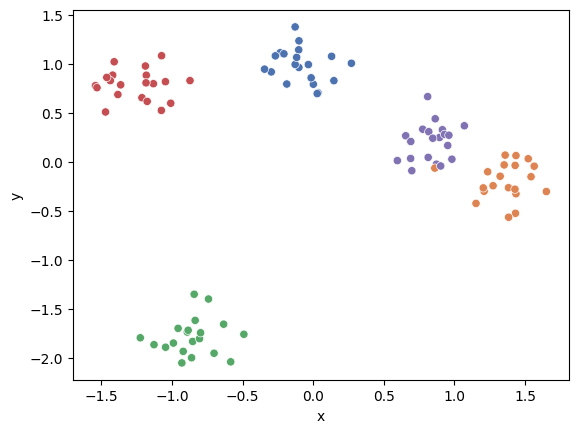

In [41]:
import seaborn as sns
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
centers = 5
X_train, true_labels = make_blobs(n_samples=100, centers=centers, random_state=42)
X_train = StandardScaler().fit_transform(X_train)
sns.scatterplot(x=[X[0] for X in X_train],
                y=[X[1] for X in X_train],
                hue=true_labels,
                palette="deep",
                legend=None
                )
plt.xlabel("x")
plt.ylabel("y")
plt.show()

Para implementar el algoritmo k-means que clasifique los datos anteriores, sigue los siguientes pasos:

 - **11a** Implementa una función que calcule la distancia euclidiana entre un punto ```point``` y un conjunto de puntos ```centroids```.

In [44]:
# implementa tu solución en la siguiente función
import math 

def euclidean(point, centroids):
    """
    Euclidean distances between a point (array-like) and some centroids (array-like).
    Point has dimensions (m,), data has dimensions (n,m), and output will be of size (n,).
    Example:
    > point: (1,2)
    > centroids: [(0,3), (4,5), (5,9)]
    > result: [2.23606798, 4.47213595, 8.06225775]
    """
    distances = []
    for centroid in centroids:
        distance = math.sqrt((point[0] - centroid[0])**2 + (point[1] - centroid[1])**2)
        distances.append(distance)
    return distances

In [45]:
euclidean((1,2), [(0,3), (4,5), (5,9)]) # REVISAR

[1.4142135623730951, 4.242640687119285, 8.06225774829855]

 - **11b** Completa la implementación de la siguiente clase para que implemente la lógica descita arriba sobre el algoritmo k-means.

In [48]:
# Completa las líneas marcadas con #######

from numpy.random import uniform

class KMeans:
    """
    KMeans clustering algorithm.
    """

    def __init__(self, n_clusters=8, max_iter=300, random_state=None):
        """
        Initialize the KMeans object.

        Parameters:
        n_clusters (int): The number of clusters to form. Default is 8.
        max_iter (int): Maximum number of iterations of the k-means algorithm for a single run. Default is 300.
        """
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = random_state  # Store the provided random state


    def fit(self, X_train):
        """
        Compute k-means clustering. Centroids will be stored in a class variable called "self.centroids"

        Parameters:
        X_train (array-like): Training instances to cluster. It must be a 2D array-like object.
        """

        # Set the random seed for reproducibility
        if self.random_state is not None:
            np.random.seed(self.random_state)

        # Randomly select centroid start points, uniformly distributed across the domain of the dataset
        min_, max_ = np.min(X_train, axis=0), np.max(X_train, axis=0)
        self.centroids = np.array([uniform(min_, max_) for _ in range(self.n_clusters)])

        # Iterate, adjusting centroids until converged or until passed max_iter
        iteration = 0
        prev_centroids = None
        while iteration < self.max_iter and not np.array_equal(prev_centroids, self.centroids):
            # Sort each datapoint, assigning to nearest centroid
            sorted_points = [[] for _ in range(self.n_clusters)]

            for x in X_train:
                dists = euclidean(x, self.centroids)
                centroid_idx = np.argmin(dists)
                sorted_points[centroid_idx].append(x)

            # Push current centroids to previous, reassign centroids as mean of the points belonging to them
            prev_centroids = self.centroids
            self.centroids = np.array([np.mean(points, axis=0) for points in sorted_points]) if iteration > 0 else self.centroids

            # Catch any np.nans, resulting from a centroid having no points
            for i, centroid in enumerate(self.centroids):
                if np.isnan(centroid).any():
                    self.centroids[i] = prev_centroids[i]

            iteration += 1

    def evaluate(self, X):
        """
        Evaluates a set of points 'X' in reference to the centroids that we
        have optimized to our training set. This method returns the centroid
        and the index of that centroid for each point.

        Parameters:
        X (array-like): Points to evaluate.
        """
        centroids = []
        centroid_idxs = []
        for x in X:
            dists = euclidean(x, self.centroids)
            centroid_idx = np.argmin(dists)
            centroids.append(self.centroids[centroid_idx])
            centroid_idxs.append(centroid_idx)
        return centroids, centroid_idxs

 - **11c** Evalúa el algoritmo que has programado sobre los datos de entrenamiento. Para ello, ejecuta la siguiente celda que generará una gráfica donde se muestran los grupos originales en código de color, la clasificación hecha por el algoritmo (indicada por las formas de los puntos) y la posición de los centroides. Comenta los resultados.

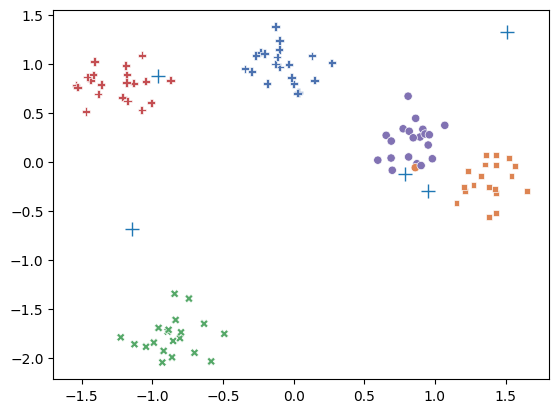

In [49]:
kmeans = KMeans(n_clusters=centers, random_state=28)  # For example
kmeans.fit(X_train)
# View results
class_centers, classification = kmeans.evaluate(X_train)
sns.scatterplot(x=[X[0] for X in X_train],
                y=[X[1] for X in X_train],
                hue=true_labels,
                style=classification,
                palette="deep",
                legend=None
                )
plt.plot([x for x, _ in kmeans.centroids],
         [y for _, y in kmeans.centroids],
         '+',
         markersize=10,
         )
plt.show()

Se puede considerar que el *KMeans* no funciona. Todo y que hay algún cluster que el centroide se aproxima (como pueden ser el caso de las cruzes rojas o los circulos azules) hay otros clusters los cuales los centroides no són optimos ( como las cruzes azules y x verdes)

 - **11d** El algoritmo anterior presenta problemas en la forma en la que se inicializan las posiciones de los centroides. Hay dos cuestiones principales:
   - Si un centroide se inicializa lejos de cualquier grupo, es improbable que se mueva.
   - Si los centroides se inicializan demasiado cerca, es poco probable que diverjan entre sí.

Actualiza la clase que del apartado anterior (comienza a partir de una copia) con un nuevo proceso de inicialización de la ubicación de los centroides. 

   1. Inicializar el primer centroide seleccionándolo aleatoriamente de entre los puntos "dato".
   2. Calcular la suma de las distancias entre cada dato y todos los actuales candidatos a centroides iniciales.
   3. Seleccionar el siguiente centroide de manera aleatoria, con una probabilidad proporcional a la distancia total a los centroides.
   4. Volver al paso 2. Repetir hasta que todos los centroides hayan sido inicializados.


In [47]:
import numpy as np
from scipy.spatial.distance import cdist

class KMeans:
    """
    KMeans clustering algorithm with improved centroid initialization.
    """

    def __init__(self, n_clusters=8, max_iter=300, random_state=None):
        """
        Initialize the KMeans object.

        Parameters:
        n_clusters (int): The number of clusters to form. Default is 8.
        max_iter (int): Maximum number of iterations of the k-means algorithm for a single run. Default is 300.
        random_state (int): Random state for reproducibility. Default is None.
        """
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = random_state

    def _initialize_centroids(self, X):
        """
        Initialize centroids using a method inspired by k-means++ to improve initial centroid positions.
        
        Parameters:
        X (array-like): Training instances to cluster.
        
        Returns:
        centroids (array-like): Initialized centroids.
        """
        if self.random_state is not None:
            np.random.seed(self.random_state)

        # Step 1: Choose the first centroid randomly from X
        centroids = [X[np.random.choice(X.shape[0])]]

        # Step 2-4: Choose each subsequent centroid based on distance
        for _ in range(1, self.n_clusters):
            # Calculate the squared distance of each point to the nearest centroid
            dist_sq = np.min(cdist(X, np.array(centroids))**2, axis=1)
            prob_distribution = dist_sq / dist_sq.sum()
            next_centroid_idx = np.random.choice(X.shape[0], p=prob_distribution)
            centroids.append(X[next_centroid_idx])

        return np.array(centroids)

    def fit(self, X_train):
        """
        Compute k-means clustering. Centroids will be stored in a class variable called "self.centroids".

        Parameters:
        X_train (array-like): Training instances to cluster. Must be a 2D array-like object.
        """
        # Initialize centroids with improved method
        self.centroids = self._initialize_centroids(X_train)

        # Iterate, adjusting centroids until convergence or max_iter is reached
        for iteration in range(self.max_iter):
            # Assign each point to the nearest centroid
            distances = cdist(X_train, self.centroids)
            labels = np.argmin(distances, axis=1)

            # Update centroids based on the mean of the points in each cluster
            new_centroids = np.array([X_train[labels == i].mean(axis=0) if np.any(labels == i) else self.centroids[i]
                                      for i in range(self.n_clusters)])

            # Check for convergence (if centroids do not change)
            if np.allclose(self.centroids, new_centroids):
                break

            self.centroids = new_centroids

    def evaluate(self, X):
        """
        Evaluates a set of points 'X' in reference to the centroids that we have optimized to our training set.
        This method returns the centroid and the index of that centroid for each point.

        Parameters:
        X (array-like): Points to evaluate.

        Returns:
        Tuple (centroids, centroid_idxs): Each point's assigned centroid and its index.
        """
        distances = cdist(X, self.centroids)
        centroid_idxs = np.argmin(distances, axis=1)
        centroids = self.centroids[centroid_idxs]
        return centroids, centroid_idxs


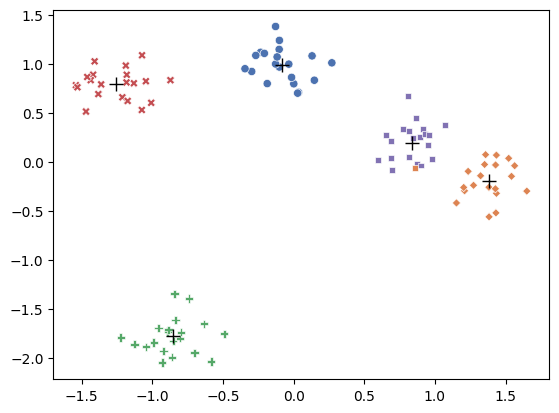

In [ ]:
#Una vez completado el ejercicio 11d, puedes evaluar los resultados con:

centers = 5
X_train, true_labels = make_blobs(n_samples=100, centers=centers, random_state=42)
X_train = [x for x in X_train]
X_train = StandardScaler().fit_transform(X_train)

# Fit centroids to dataset
kmeans = KMeans(n_clusters=centers, random_state=28)  # For example
kmeans.fit(X_train)

# View results
class_centers, classification = kmeans.evaluate(X_train)
sns.scatterplot(x=[X[0] for X in X_train],
                y=[X[1] for X in X_train],
                hue=true_labels,
                style=classification,
                palette="deep",
                legend=None
                )
plt.plot([x for x, _ in kmeans.centroids],
         [y for _, y in kmeans.centroids],
         'k+',
         markersize=10,
         )
plt.show()

Con esta nuevo implementación obtenemos resultados óptimos, vemos que los centroides están perfectamente centrados en cada uno de los clusters.